#### Imports

In [1]:
#TODO: format according to PEP8

In [2]:
import pandas as pd
import numpy as np
import dtreeviz
import graphviz
import re
import scipy
import scipy.cluster.hierarchy as hc
import matplotlib.pyplot as plt
from pathlib import Path

from sklearn.model_selection import StratifiedShuffleSplit
from sklearn.pipeline import Pipeline
from sklearn.ensemble import RandomForestRegressor
from sklearn.compose import ColumnTransformer
from sklearn.preprocessing import OrdinalEncoder
from sklearn.tree import DecisionTreeRegressor
from sklearn.inspection import plot_partial_dependence
from sklearn.tree import export_graphviz

In [3]:
DATA_PATH = Path.cwd()/'Data'

In [4]:
N_JOBS=-1
N_CV=5
RAND_STATE = 0

In [5]:
full_df = pd.read_csv(DATA_PATH/'Final_data.csv', low_memory=False)
full_df.drop(labels='AlkPhos_UL', inplace=True, axis=1, errors='ignore')

#### Splitting

In [6]:
#Adding categorical age column for proportional/stratified train/test split
AGE_GROUP_AMOUNT = 8
full_df['AGE_GROUP'] = pd.cut(full_df['AGE'], bins=AGE_GROUP_AMOUNT,
                              labels=range(AGE_GROUP_AMOUNT))

#Making train test split with proportional age groups
split = StratifiedShuffleSplit(n_splits=1, test_size=0.1,
                               random_state=RAND_STATE)
for train_index, test_index in split.split(full_df, full_df['AGE_GROUP']):
    strat_train_set = full_df.iloc[train_index]
    strat_test_set = full_df.iloc[test_index]

#### EDA

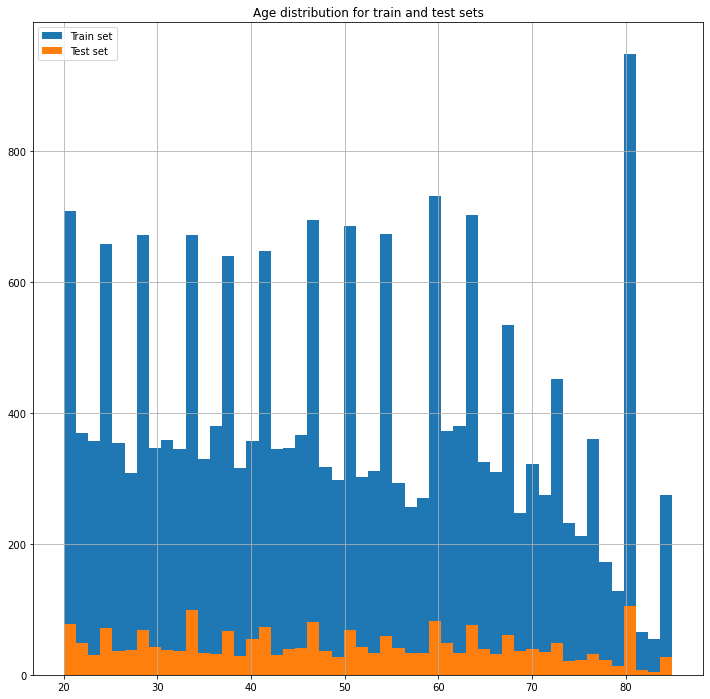

In [7]:
strat_train_set.AGE.hist(bins=50, figsize=(12,12), legend=True),
strat_test_set.AGE.hist(bins=50, figsize=(12,12), legend=True)
plt.title("Age distribution for train and test sets")
plt.legend(["Train set", "Test set"])
#TODO increase font, make the graph look better, assign axis names...

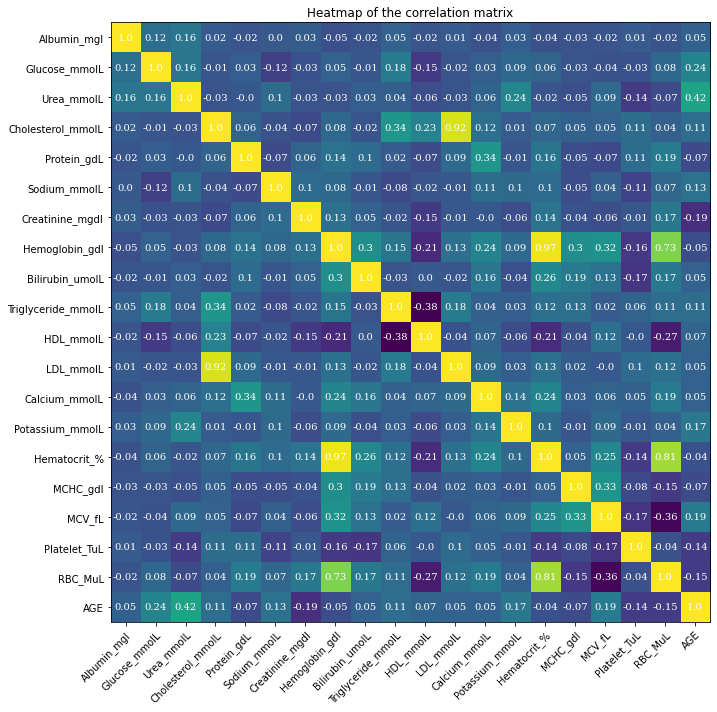

In [8]:
features = strat_train_set.drop(labels=["SEQN", "GENDER", "AGE_GROUP"],
                                axis=1).columns
corr_mat = strat_train_set.drop(labels=["SEQN", "GENDER", "AGE_GROUP"],
                                axis=1).corr().to_numpy()

fig, ax = plt.subplots()
im = ax.imshow(corr_mat)
fig.set_size_inches(10, 10, forward=True)
font = {'size': 10, 'family': 'serif'}

ax.set_xticks(np.arange(len(features)))
ax.set_yticks(np.arange(len(features)))
ax.set_xticklabels(features)
ax.set_yticklabels(features)

plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

for i in range(len(features)):
    for j in range(len(features)):
        text = ax.text(j, i, round(corr_mat[i, j], 2), ha="center", va="center",
                       color="w", fontdict=font)

ax.set_title("Heatmap of the correlation matrix")
fig.tight_layout()
plt.show()
#TODO: maybe show not the full heatmap but only the most correlated features

#### Cleaning

In [9]:
full_transform = ColumnTransformer([
    ('encoder', OrdinalEncoder(), ['GENDER']),
    ('drop', 'drop', ['SEQN', 'AGE_GROUP', 'AGE']),
    ('passthrough', 'passthrough', list(strat_train_set.columns)[2:-2]),
])
trans_train = full_transform.fit_transform(strat_train_set)

#### Decision Tree + Viz

In [10]:
def draw_tree(t, df, size=10, ratio=0.6, precision=0, **kwargs):
    s=export_graphviz(t, out_file=None, feature_names=df.columns, filled=True, rounded=True,
                      special_characters=True, rotate=False, precision=precision, **kwargs)
    return graphviz.Source(re.sub('Tree {', f'Tree {{ size={size}; ratio={ratio}', s))

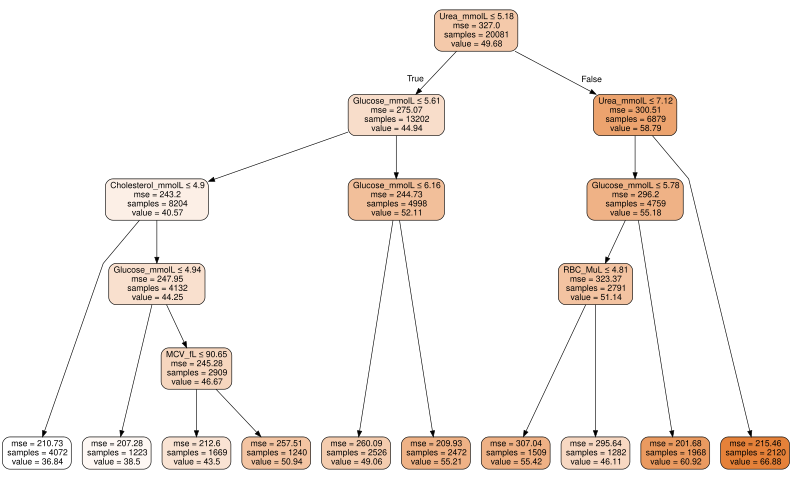

In [11]:
x = pd.DataFrame(full_transform.fit_transform(strat_train_set), 
                 columns=strat_train_set.columns[1:-2])
y = strat_train_set['AGE']

m = DecisionTreeRegressor(max_leaf_nodes=10)
m.fit(x,y)
draw_tree(m, x, size=11, leaves_parallel=True, precision=2)

In [12]:
dtreeviz.trees.dtreeviz(m, x, y, x.columns, 'AGE',
        fontname='DejaVu Sans', scale=1.8, label_fontsize=8,
        orientation='TD')

#### Random Forest

In [14]:
rfr = RandomForestRegressor(random_state=RAND_STATE, n_jobs=N_JOBS,
                            n_estimators=200, oob_score=True,
                            max_features='auto', max_samples=0.8,
                            min_samples_leaf=5)

In [14]:
rfr.fit(trans_train, strat_train_set.AGE)


RandomForestRegressor(max_samples=0.8, min_samples_leaf=5, n_estimators=200,
                      n_jobs=-1, oob_score=True, random_state=0)

##### Out of Bag MAE Error

In [15]:
sum(abs(rfr.oob_prediction_ - strat_train_set.AGE.to_numpy()))/len(strat_train_set)

10.494652359514467

In [14]:
#TODO: Calculate MAE on test set, or remove test train split and rely only in OOB Error

##### Model confidence through the std of every single DT prediction in the forest

In [16]:
preds = np.stack([t.predict(trans_train) for t in rfr.estimators_])
preds.std(0).mean()

9.746378217238542

##### Feature Importance

In [17]:
df_trans_train = pd.DataFrame(trans_train,
                              columns=strat_train_set.columns[1:-2])

In [18]:
fi = pd.DataFrame({'feature':df_trans_train.columns,
                   'importance':rfr.feature_importances_}
                 ).sort_values('importance', ascending=False)

<AxesSubplot:title={'center':'Feature importance'}, ylabel='feature'>

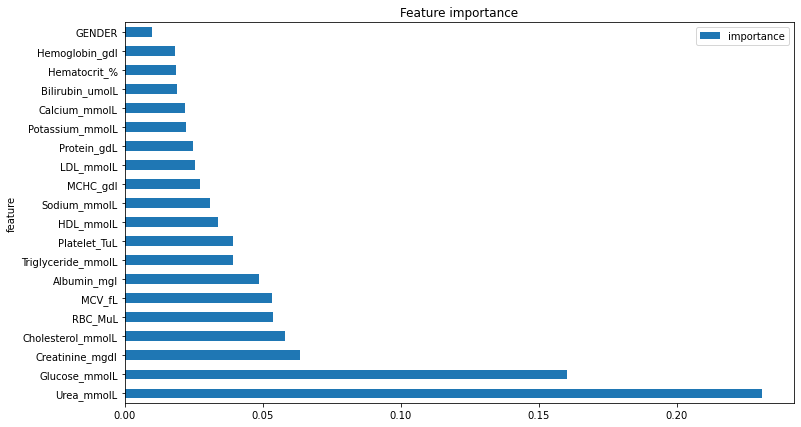

In [19]:
fi.plot('feature', 'importance', 'barh', figsize=(12,7), legend=True,
        title="Feature importance")

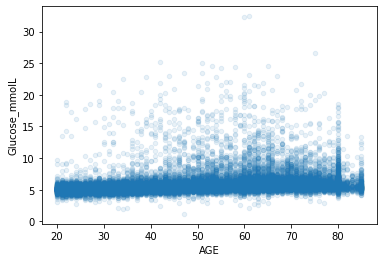

0.23697089869739085


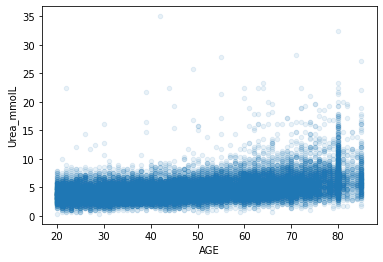

0.41841094090214015


In [20]:
corr_mat = strat_train_set.corr()
important_features = ['Glucose_mmolL', 'Urea_mmolL']
for site in important_features:
    strat_train_set.plot(kind='scatter', x='AGE', y=site, alpha=0.1)
    plt.show()
    print(corr_mat['AGE'][str(site)])

In [21]:
#TODO: Do not redefine/recalculate corr_mat, define it only once and then edit

In [22]:
#TODO: investigate unordinary vertical lines at age 80 and 85

##### Redundant Features

In [23]:
def cluster_columns(df, figsize=(10,6), font_size=12):
    corr = np.round(scipy.stats.spearmanr(df).correlation, 4)
    corr_condensed = hc.distance.squareform(1-corr)
    z = hc.linkage(corr_condensed, method='average')
    fig = plt.figure(figsize=figsize)
    hc.dendrogram(z, labels=df.columns, orientation='left', leaf_font_size=font_size)
    plt.show()

In this chart, the pairs of columns that are most similar are the ones that were merged  
together early, far from the “root” of the tree at the left.  
So, Hematocritic and Hemoglobin are the most redundant w.r.t. each other.

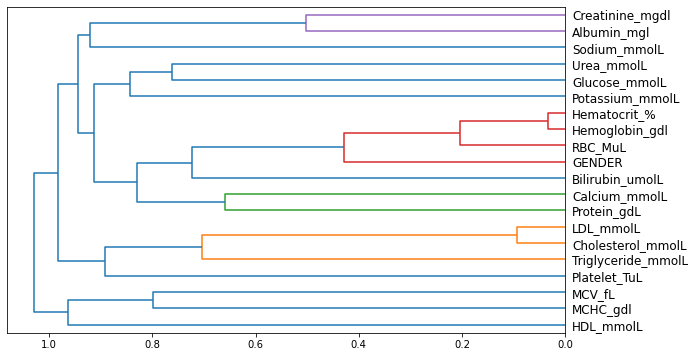

In [24]:
cluster_columns(df_trans_train)

##### Partial Dependence

/opt/conda/envs/py3_9/lib/python3.9/site-packages/sklearn/utils/deprecation.py:87: FutureWarning: Function plot_partial_dependence is deprecated; Function `plot_partial_dependence` is deprecated in 1.0 and will be removed in 1.2. Use PartialDependenceDisplay.from_estimator instead
  warnings.warn(msg, category=FutureWarning)


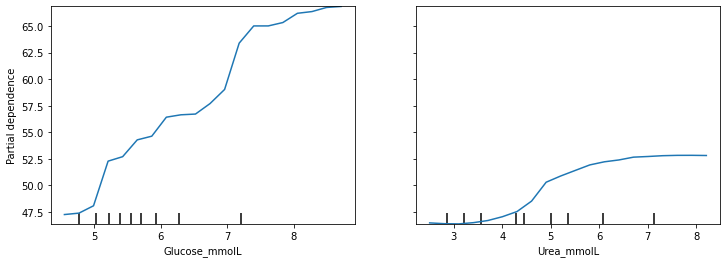

In [25]:
fig,ax = plt.subplots(figsize=(12, 4))
plot_partial_dependence(rfr, strat_test_set, important_features,
                        grid_resolution=20, ax=ax);

In [26]:
#TODO: resolve the warning above

In [27]:
#TODO Use tree interpreter and waterfall to show the importance of each feature
#for a particular data point inference. Implement this in final DNN and display
#it on the website